
# ****ARTWORK SIMILARITY SEARCH - CONTENT VS. STYLE ANALYSIS****



> Authors: Yeji Kim, Shambhavi Adhikari

> CSCI 6527 - Computer Vision

In [5]:
import os
import random
import pickle
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import normalize

In [6]:
# =============================================================================
# CONFIGURATION
# =============================================================================

class Config:
    ROOT = "/kaggle/input/wikiart"  # adjust if needed
    OUTPUT_DIR = "/kaggle/working"
    
    IMG_SIZE = 224
    BATCH_SIZE = 16
    NUM_WORKERS = 2
    
    SUBSET_STYLES = [
        "Impressionism", "Post_Impressionism", "Cubism",
        "Abstract_Expressionism", "Realism", "Expressionism",
        "Art_Nouveau_Modern", "Color_Field_Painting"
    ]
    IMAGES_PER_STYLE = 1500
    
    ENABLE_MULTICROP = True
    N_CROPS = 8
    ENABLE_PCA = True
    PCA_DIM = 512
    ENABLE_RERANKING = True
    ENABLE_ENSEMBLE = True  # Use DINO-B + DINO-L
    
    ANNOTATION_SAMPLE_SIZE = 500
    EVAL_SAMPLE_SIZE = 2000
    TOP_K_VALUES = [1, 5, 10, 20, 50]
    
    SEED = 42
    DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

cfg = Config()
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

random.seed(cfg.SEED)
np.random.seed(cfg.SEED)
torch.manual_seed(cfg.SEED)
print("="*70)
print("ARTWORK SIMILARITY: STRATEGY C - CONTENT vs STYLE")
print("="*70)
print(f"Device: {cfg.DEVICE}")
print(f"Multi-crop: {cfg.N_CROPS} views")
print(f"PCA: target dim = {cfg.PCA_DIM}")
print(f"Re-ranking: {cfg.ENABLE_RERANKING}")
print(f"Ensemble: {cfg.ENABLE_ENSEMBLE}")
print("="*70 + "\n")

ARTWORK SIMILARITY: STRATEGY C - CONTENT vs STYLE
Device: cuda
Multi-crop: 8 views
PCA: target dim = 512
Re-ranking: True
Ensemble: True



In [7]:
# =============================================================================
# PART 1: DATA PREPARATION WITH CONTENT ANNOTATIONS
# =============================================================================

def build_metadata_from_folders(root_dir):
    rows = []
    for style_folder in sorted(os.listdir(root_dir)):
        style_path = os.path.join(root_dir, style_folder)
        if not os.path.isdir(style_path):
            continue
        
        for filename in sorted(os.listdir(style_path)):
            if not filename.lower().endswith(('.jpg', '.jpeg', '.png')):
                continue
            
            # Parse filename: artist_title_year.jpg (best-effort)
            name_no_ext = os.path.splitext(filename)[0]
            parts = name_no_ext.split('_')
            artist = parts[0] if parts else 'unknown'
            
            title_lower = filename.lower()
            content = 'abstract'  # default
            if any(word in title_lower for word in ['portrait', 'woman', 'man', 'girl', 'boy', 'self']):
                content = 'portrait'
            elif any(word in title_lower for word in ['landscape', 'garden', 'river', 'sea', 'mountain', 'trees', 'forest']):
                content = 'landscape'
            elif any(word in title_lower for word in ['still-life', 'vase', 'flowers', 'fruit', 'bottle']):
                content = 'still_life'
            elif any(word in title_lower for word in ['city', 'street', 'building', 'bridge', 'harbor']):
                content = 'cityscape'
            
            rows.append({
                'id': len(rows),
                'style': style_folder,
                'image_name': filename,
                'image_path': os.path.join(style_folder, filename),
                'artist': artist,
                'content': content
            })
    
    return pd.DataFrame(rows)

def create_balanced_subset(metadata_df, target_styles, images_per_style):
    subset_parts = []
    
    for style in target_styles:
        style_images = metadata_df[metadata_df['style'] == style]
        if len(style_images) == 0:
            print(f"  Warning: Style '{style}' not found")
            continue
        
        n_sample = min(images_per_style, len(style_images))
        sampled_indices = []
        for content_type in ['portrait', 'landscape', 'still_life', 'cityscape', 'abstract']:
            content_subset = style_images[style_images['content'] == content_type]
            if len(content_subset) > 0:
                n_content = min(n_sample // 5, len(content_subset))
                sampled_indices.extend(content_subset.sample(n=n_content, random_state=cfg.SEED).index.tolist())
        
        if len(sampled_indices) < n_sample:
            remaining = style_images.drop(sampled_indices)
            additional = remaining.sample(n=min(n_sample - len(sampled_indices), len(remaining)), random_state=cfg.SEED)
            sampled_indices.extend(additional.index.tolist())
        
        subset_parts.append(style_images.loc[sampled_indices[:n_sample]])
        print(f"  {style}: {len(sampled_indices[:n_sample])} images")
        content_dist = style_images.loc[sampled_indices[:n_sample]]['content'].value_counts()
        print(f"     Content: {dict(content_dist)}")
    
    subset_df = pd.concat(subset_parts, ignore_index=True)
    subset_df['id'] = np.arange(len(subset_df))
    return subset_df

print("Building metadata with content annotations...")
subset_cache = os.path.join(cfg.OUTPUT_DIR, "metadata_strategy_c.csv")

if os.path.exists(subset_cache):
    subset_metadata = pd.read_csv(subset_cache)
    print("Loaded cached metadata\n")
else:
    full_metadata = build_metadata_from_folders(cfg.ROOT)
    print(f"Found {len(full_metadata):,} total images\n")
    
    print("Creating balanced subset with content diversity...")
    subset_metadata = create_balanced_subset(full_metadata, cfg.SUBSET_STYLES, cfg.IMAGES_PER_STYLE)
    subset_metadata.to_csv(subset_cache, index=False)
    print("Saved metadata\n")

print(f"Dataset Statistics:")
print(f"   Total: {len(subset_metadata):,} images")
print(f"   Styles: {subset_metadata['style'].nunique()}")
print(f"   Artists: {subset_metadata['artist'].nunique()}")
print(f"   Content distribution:\n{subset_metadata['content'].value_counts()}\n")


Building metadata with content annotations...
Found 81,444 total images

Creating balanced subset with content diversity...
  Impressionism: 1500 images
     Content: {'portrait': 300, 'landscape': 300, 'still_life': 300, 'cityscape': 300, 'abstract': 300}
  Post_Impressionism: 1500 images
     Content: {'abstract': 403, 'landscape': 322, 'portrait': 321, 'still_life': 304, 'cityscape': 150}
  Cubism: 1500 images
     Content: {'abstract': 796, 'portrait': 307, 'still_life': 220, 'landscape': 144, 'cityscape': 33}
  Abstract_Expressionism: 1500 images
     Content: {'abstract': 1189, 'portrait': 193, 'landscape': 93, 'cityscape': 13, 'still_life': 12}
  Realism: 1500 images
     Content: {'abstract': 429, 'portrait': 358, 'landscape': 320, 'still_life': 305, 'cityscape': 88}
  Expressionism: 1500 images
     Content: {'abstract': 508, 'portrait': 363, 'landscape': 305, 'still_life': 220, 'cityscape': 104}
  Art_Nouveau_Modern: 1500 images
     Content: {'abstract': 899, 'portrait': 390

In [8]:
# =============================================================================
# PART 2: MULTI-CROP DATASET
# =============================================================================

class MultiCropArtworkDataset(Dataset):
    def __init__(self, metadata_df, root_dir, transform=None, n_crops=8):
        self.df = metadata_df.reset_index(drop=True)
        self.root = root_dir
        self.transform = transform
        self.n_crops = n_crops
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = os.path.join(self.root, row['style'], row['image_name'])
        
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception:
            image = Image.new('RGB', (cfg.IMG_SIZE, cfg.IMG_SIZE), (128, 128, 128))
        
        crops = []
        crops.append(T.CenterCrop(cfg.IMG_SIZE)(image))
        
        w, h = image.size
        if w >= cfg.IMG_SIZE and h >= cfg.IMG_SIZE:
            crops.append(image.crop((0, 0, cfg.IMG_SIZE, cfg.IMG_SIZE)))
            crops.append(image.crop((w-cfg.IMG_SIZE, 0, w, cfg.IMG_SIZE)))
            crops.append(image.crop((0, h-cfg.IMG_SIZE, cfg.IMG_SIZE, h)))
            crops.append(image.crop((w-cfg.IMG_SIZE, h-cfg.IMG_SIZE, w, h)))
        else:
            for _ in range(4):
                crops.append(T.Resize((cfg.IMG_SIZE, cfg.IMG_SIZE))(image))
        
        for i in range(self.n_crops - 5):
            aug_img = T.RandomResizedCrop(cfg.IMG_SIZE, scale=(0.7, 1.0))(image)
            if random.random() > 0.5:
                aug_img = T.RandomHorizontalFlip(p=1.0)(aug_img)
            if random.random() > 0.7:
                aug_img = T.ColorJitter(brightness=0.1, contrast=0.1)(aug_img)
            crops.append(aug_img)
        
        if self.transform:
            crops = [self.transform(crop) for crop in crops]
        
        return {
            'image': torch.stack(crops),
            'id': row['id'],
            'style': row['style'],
            'artist': row['artist'],
            'content': row['content'],
            'path': img_path
        }

transform = T.Compose([
    T.Resize((cfg.IMG_SIZE, cfg.IMG_SIZE)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [9]:
# =============================================================================
# PART 3: MODEL LOADING (robust)
# =============================================================================

def load_dinov2_model(model_name="dinov2_vitb14"):
    print(f"Loading DINOv2 model: {model_name} ...")
    try:
        model = torch.hub.load('facebookresearch/dinov2', model_name)
        model.to(cfg.DEVICE)
        model.eval()
        print(f"Loaded {model_name} on {cfg.DEVICE}")
        return model
    except Exception as e:
        print("Failed to load DINOv2 via torch.hub. Please ensure DINOv2 is available in the environment.")
        print("Error:", e)
        raise

def load_resnet50():
    print("Loading ResNet-50 baseline...")
    from torchvision import models
    resnet = models.resnet50(pretrained=True)
    model = torch.nn.Sequential(*list(resnet.children())[:-1])  # remove final classifier
    model.to(cfg.DEVICE)
    model.eval()
    print(f"Loaded ResNet-50 on {cfg.DEVICE}")
    return model

def model_forward_to_numpy(model, images_tensor):
    """Call model and return numpy array of shape (N, D)."""
    with torch.no_grad():
        out = model(images_tensor)
    # Handle dict/tuple/list
    if isinstance(out, dict):
        # try common keys
        for k in ('global', 'features', 'x', 'last_hidden_state', 'logits', 'out'):
            if k in out:
                feat = out[k]
                break
        else:
            # fallback: take first tensor-like value
            feat = list(out.values())[0]
    elif isinstance(out, (list, tuple)):
        feat = out[0]
    else:
        feat = out
    if isinstance(feat, torch.Tensor):
        feat = feat.cpu().numpy()
    # collapse spatial dims if present, e.g., (N, C, 1, 1) or (N, H, W, C)
    if feat.ndim == 4:
        feat = feat.reshape(feat.shape[0], -1)
    return feat


In [10]:
# =============================================================================
# PART 4: ENHANCED EMBEDDING EXTRACTION
# =============================================================================

def extract_embeddings_multicrop(model, metadata_df, model_name="model", n_crops=8):
    dataset = MultiCropArtworkDataset(metadata_df, cfg.ROOT, transform=transform, n_crops=n_crops)
    dataloader = DataLoader(
        dataset,
        batch_size=cfg.BATCH_SIZE,
        shuffle=False,
        num_workers=cfg.NUM_WORKERS,
        pin_memory=True
    )
    
    print(f"Extracting {model_name} embeddings ({n_crops}-crop augmentation)...")
    all_embeddings = []
    all_ids = []
    all_styles = []
    all_artists = []
    all_contents = []
    all_paths = []
    
    with torch.no_grad():
        for batch in tqdm(dataloader, desc=f"{model_name}"):
            images = batch['image'].to(cfg.DEVICE)  # (B, n_crops, 3, H, W)
            B, n_crops = images.shape[0], images.shape[1]
            images_flat = images.view(B * n_crops, 3, cfg.IMG_SIZE, cfg.IMG_SIZE)
            
            features = model_forward_to_numpy(model, images_flat)
            
            # Ensure shape (B*n_crops, D)
            if features.ndim == 1:
                features = features.reshape(1, -1)
            if features.shape[0] != B * n_crops:
                # fallback: try to handle trailing singleton dims
                features = features.reshape(B * n_crops, -1)
            
            # Reshape and average over crops
            features = features.reshape(B, n_crops, -1).mean(axis=1)
            all_embeddings.append(features)
            all_ids.extend(batch['id'].numpy())
            all_styles.extend(batch['style'])
            all_artists.extend(batch['artist'])
            all_contents.extend(batch['content'])
            all_paths.extend(batch['path'])
    
    embeddings = np.vstack(all_embeddings).astype(np.float32)
    print(f"Extracted embeddings shape: {embeddings.shape}")
    
    # PCA
    if cfg.ENABLE_PCA:
        n_components = min(cfg.PCA_DIM, embeddings.shape[1])
        print(f"Applying PCA: {embeddings.shape[1]} -> {n_components}")
        pca = PCA(n_components=n_components, whiten=True, random_state=cfg.SEED)
        embeddings = pca.fit_transform(embeddings)
        explained = pca.explained_variance_ratio_.sum() if hasattr(pca, 'explained_variance_ratio_') else 0.0
        print(f"Variance explained (approx): {explained:.4f}")
    
    embeddings = normalize(embeddings, axis=1)
    
    data = {
        'embeddings': embeddings,
        'ids': np.array(all_ids),
        'styles': np.array(all_styles),
        'artists': np.array(all_artists),
        'contents': np.array(all_contents),
        'paths': np.array(all_paths)
    }
    return data

def save_load_embeddings(filename):
    path = os.path.join(cfg.OUTPUT_DIR, f"{filename}.pkl")
    def save(data):
        with open(path, 'wb') as f:
            pickle.dump(data, f)
        print(f"Saved: {filename}")
    def load():
        if os.path.exists(path):
            with open(path, 'rb') as f:
                return pickle.load(f)
        return None
    return save, load

# Extract DINOv2-B
save_dino_b, load_dino_b = save_load_embeddings("dino_vitb_strategy_c")
dino_b_emb = load_dino_b()
if dino_b_emb is None:
    dino_b_model = load_dinov2_model("dinov2_vitb14")
    dino_b_emb = extract_embeddings_multicrop(dino_b_model, subset_metadata, "DINOv2-B", cfg.N_CROPS)
    save_dino_b(dino_b_emb)
    del dino_b_model
    torch.cuda.empty_cache()
else:
    print("Loaded cached DINOv2-B embeddings")

# Extract DINOv2-L and ensemble
if cfg.ENABLE_ENSEMBLE:
    save_dino_l, load_dino_l = save_load_embeddings("dino_vitl_strategy_c")
    dino_l_emb = load_dino_l()
    if dino_l_emb is None:
        dino_l_model = load_dinov2_model("dinov2_vitl14")
        dino_l_emb = extract_embeddings_multicrop(dino_l_model, subset_metadata, "DINOv2-L", cfg.N_CROPS)
        save_dino_l(dino_l_emb)
        del dino_l_model
        torch.cuda.empty_cache()
    else:
        print("Loaded cached DINOv2-L embeddings")
    
    print("Creating DINOv2 ensemble (concatenate B + L)")
    # If dims differ (because of PCA on each), ensure shapes match
    emb_b = dino_b_emb['embeddings']
    emb_l = dino_l_emb['embeddings']
    if emb_b.shape[0] != emb_l.shape[0]:
        raise ValueError("DINO-B and DINO-L embedding counts do not match.")
    ensemble_emb = np.hstack([emb_b, emb_l])
    ensemble_emb = normalize(ensemble_emb, axis=1)
    dino_ensemble = {
        'embeddings': ensemble_emb,
        'ids': dino_b_emb['ids'],
        'styles': dino_b_emb['styles'],
        'artists': dino_b_emb['artists'],
        'contents': dino_b_emb['contents'],
        'paths': dino_b_emb['paths']
    }
    print(f"Ensemble shape: {ensemble_emb.shape}\n")
else:
    dino_ensemble = dino_b_emb

# Extract ResNet-50
save_resnet, load_resnet = save_load_embeddings("resnet50_strategy_c")
resnet_emb = load_resnet()
if resnet_emb is None:
    resnet_model = load_resnet50()
    resnet_emb = extract_embeddings_multicrop(resnet_model, subset_metadata, "ResNet-50", cfg.N_CROPS)
    save_resnet(resnet_emb)
    del resnet_model
    torch.cuda.empty_cache()
else:
    print("Loaded cached ResNet-50 embeddings")


Loading DINOv2 model: dinov2_vitb14 ...


Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitb14/dinov2_vitb14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitb14_pretrain.pth
100%|██████████| 330M/330M [00:01<00:00, 274MB/s] 


Loaded dinov2_vitb14 on cuda
Extracting DINOv2-B embeddings (8-crop augmentation)...


DINOv2-B: 100%|██████████| 750/750 [24:46<00:00,  1.98s/it]


Extracted embeddings shape: (12000, 768)
Applying PCA: 768 -> 512
Variance explained (approx): 0.9659
Saved: dino_vitb_strategy_c
Loading DINOv2 model: dinov2_vitl14 ...


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main
Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vitl14/dinov2_vitl14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vitl14_pretrain.pth
100%|██████████| 1.13G/1.13G [00:05<00:00, 224MB/s] 


Loaded dinov2_vitl14 on cuda
Extracting DINOv2-L embeddings (8-crop augmentation)...


DINOv2-L: 100%|██████████| 750/750 [1:21:24<00:00,  6.51s/it]


Extracted embeddings shape: (12000, 1024)
Applying PCA: 1024 -> 512
Variance explained (approx): 0.9289
Saved: dino_vitl_strategy_c
Creating DINOv2 ensemble (concatenate B + L)
Ensemble shape: (12000, 1024)

Loading ResNet-50 baseline...


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 187MB/s]


Loaded ResNet-50 on cuda
Extracting ResNet-50 embeddings (8-crop augmentation)...


ResNet-50: 100%|██████████| 750/750 [07:23<00:00,  1.69it/s]


Extracted embeddings shape: (12000, 2048)
Applying PCA: 2048 -> 512
Variance explained (approx): 0.9773
Saved: resnet50_strategy_c


In [11]:
# =============================================================================
# PART 5: ENHANCED SEARCH ENGINE WITH RE-RANKING
# =============================================================================

class EnhancedSearchEngine:
    def __init__(self, embedding_data, enable_reranking=True):
        self.embeddings = embedding_data['embeddings']
        self.ids = embedding_data['ids']
        self.styles = embedding_data['styles']
        self.artists = embedding_data['artists']
        self.contents = embedding_data['contents']
        self.paths = embedding_data['paths']
        self.enable_reranking = enable_reranking
        
        if self.enable_reranking:
            print("Computing similarity matrix for re-ranking (may be memory heavy)...")
            self.sim_matrix = self.embeddings @ self.embeddings.T
            print("Similarity matrix computed.")
        else:
            self.sim_matrix = None
    
    def search(self, query_idx, top_k=10):
        if self.enable_reranking and cfg.ENABLE_RERANKING:
            return self._search_with_reranking(query_idx, top_k)
        else:
            return self._search_basic(query_idx, top_k)
    
    def _search_basic(self, query_idx, top_k):
        if self.sim_matrix is not None:
            sims = self.sim_matrix[query_idx]
        else:
            sims = np.dot(self.embeddings, self.embeddings[query_idx])
        ranked = np.argsort(sims)[::-1]
        ranked = ranked[ranked != query_idx]
        return ranked[:top_k], sims[ranked[:top_k]]
    
    def _search_with_reranking(self, query_idx, top_k, k1=30, alpha=0.6):
        if self.sim_matrix is None:
            return self._search_basic(query_idx, top_k)
        initial_sims = self.sim_matrix[query_idx]
        candidates = np.argsort(initial_sims)[::-1]
        candidates = candidates[candidates != query_idx][:k1]
        reciprocal_scores = np.zeros(len(candidates))
        for i, cand in enumerate(candidates):
            cand_neighbors = np.argsort(self.sim_matrix[cand])[::-1][:k1]
            if query_idx in cand_neighbors:
                rank_in_cand = np.where(cand_neighbors == query_idx)[0][0]
                reciprocal_scores[i] = 1.0 - (rank_in_cand / k1)
        final_scores = alpha * initial_sims[candidates] + (1 - alpha) * reciprocal_scores
        reranked_order = np.argsort(-final_scores)
        final_indices = candidates[reranked_order[:top_k]]
        return final_indices, self.sim_matrix[query_idx, final_indices]

In [12]:
# =============================================================================
# PART 6: EVALUATIONS
# =============================================================================

def evaluate_content_vs_style(engine, sample_size=2000):
    print("\n" + "="*70)
    print("STRATEGY C: CONTENT vs STYLE ANALYSIS")
    print("="*70)
    
    n = len(engine.styles)
    indices = np.random.choice(n, min(sample_size, n), replace=False)
    
    style_matches = 0
    content_matches = 0
    both_matches = 0
    neither_matches = 0
    total_retrievals = 0
    style_vs_content_detailed = []
    
    for idx in tqdm(indices, desc="Analyzing content/style"):
        query_style = engine.styles[idx]
        query_content = engine.contents[idx]
        top_idx, sims = engine.search(idx, top_k=10)
        for i, retr_idx in enumerate(top_idx):
            retr_style = engine.styles[retr_idx]
            retr_content = engine.contents[retr_idx]
            style_match = (retr_style == query_style)
            content_match = (retr_content == query_content)
            if style_match and content_match:
                both_matches += 1
            elif style_match and not content_match:
                style_matches += 1
                style_vs_content_detailed.append({
                    'type': 'style_only',
                    'query_style': query_style,
                    'query_content': query_content,
                    'retr_content': retr_content,
                    'rank': i+1,
                    'similarity': sims[i]
                })
            elif content_match and not style_match:
                content_matches += 1
                style_vs_content_detailed.append({
                    'type': 'content_only',
                    'query_style': query_style,
                    'query_content': query_content,
                    'retr_style': retr_style,
                    'rank': i+1,
                    'similarity': sims[i]
                })
            else:
                neither_matches += 1
            total_retrievals += 1
    
    style_pct = (style_matches / total_retrievals) * 100 if total_retrievals > 0 else 0.0
    content_pct = (content_matches / total_retrievals) * 100 if total_retrievals > 0 else 0.0
    both_pct = (both_matches / total_retrievals) * 100 if total_retrievals > 0 else 0.0
    neither_pct = (neither_matches / total_retrievals) * 100 if total_retrievals > 0 else 0.0
    style_dominance = style_pct / (content_pct + 1e-10)
    
    print(f"Content vs Style Results:")
    print(f"   Style-only matches: {style_matches:,} ({style_pct:.1f}%)")
    print(f"   Content-only matches: {content_matches:,} ({content_pct:.1f}%)")
    print(f"   Both matches: {both_matches:,} ({both_pct:.1f}%)")
    print(f"   Neither matches: {neither_matches:,} ({neither_pct:.1f}%)")
    print(f"   Style dominance ratio: {style_dominance:.2f}x")
    return {
        'style_only_matches': style_matches,
        'content_only_matches': content_matches,
        'both_matches': both_matches,
        'neither_matches': neither_matches,
        'total_retrievals': total_retrievals,
        'style_pct': style_pct,
        'content_pct': content_pct,
        'both_pct': both_pct,
        'neither_pct': neither_pct,
        'style_dominance': style_dominance,
        'detailed': style_vs_content_detailed
    }

def evaluate_standard_metrics(engine, sample_size=2000):
    styles = engine.styles
    n = len(styles)
    indices = np.random.choice(n, min(sample_size, n), replace=False)
    
    acc_results = {}
    for k in cfg.TOP_K_VALUES:
        correct = 0
        for idx in tqdm(indices, desc=f"Acc@{k}", leave=False):
            top_idx, _ = engine.search(idx, top_k=k)
            if np.any(styles[top_idx] == styles[idx]):
                correct += 1
        acc_results[f"Accuracy@{k}"] = correct / len(indices)
    
    aps = []
    for idx in tqdm(indices, desc="MAP", leave=False):
        top_idx, _ = engine.search(idx, top_k=len(styles)-1)
        relevant = (styles[top_idx] == styles[idx]).astype(int)
        if relevant.sum() == 0:
            aps.append(0.0)
            continue
        cumsum = np.cumsum(relevant)
        positions = np.arange(1, len(relevant) + 1)
        precision_at_k = cumsum / positions
        ap = np.sum(precision_at_k * relevant) / relevant.sum()
        aps.append(ap)
    map_score = np.mean(aps)
    
    unique_styles = np.unique(styles)
    if len(unique_styles) > 1:
        sample_idx = np.random.choice(len(styles), min(5000, len(styles)), replace=False)
        style_labels = np.array([np.where(unique_styles == s)[0][0] for s in styles[sample_idx]])
        sil = silhouette_score(engine.embeddings[sample_idx], style_labels)
    else:
        sil = 0.0
    
    # Artist coherence
    artists = engine.artists
    artist_correct = 0
    artist_sample = min(1000, len(artists))
    artist_indices = np.random.choice(len(artists), artist_sample, replace=False)
    for idx in tqdm(artist_indices, desc="Artist", leave=False):
        top_idx, _ = engine.search(idx, top_k=10)
        if np.any(artists[top_idx] == artists[idx]):
            artist_correct += 1
    artist_coherence = artist_correct / artist_sample if artist_sample > 0 else 0.0
    
    # Precision@10
    prec10s = []
    for idx in tqdm(indices, desc="Prec@10", leave=False):
        top_idx, _ = engine.search(idx, top_k=10)
        prec10 = (styles[top_idx] == styles[idx]).sum() / 10.0
        prec10s.append(prec10)
    precision_at_10 = np.mean(prec10s)
    
    return {
        'accuracy': acc_results,
        'map': map_score,
        'silhouette': sil,
        'artist_coherence': artist_coherence,
        'precision_at_10': precision_at_10
    }


In [13]:
# =============================================================================
# PART 7: RUN EVALUATIONS
# =============================================================================

print("\n" + "="*70)
print("EVALUATION: DINOv2 ENSEMBLE")
print("="*70)
dino_engine = EnhancedSearchEngine(dino_ensemble, enable_reranking=cfg.ENABLE_RERANKING)

print("\nStandard Metrics (DINOv2):")
dino_standard = evaluate_standard_metrics(dino_engine, cfg.EVAL_SAMPLE_SIZE)

print(f"\nDINOv2 Standard Results:")
print(f"   MAP: {dino_standard['map']:.6f}")
print(f"   Silhouette: {dino_standard['silhouette']:.6f}")
print(f"   Acc@1: {dino_standard['accuracy']['Accuracy@1']:.4f}")
print(f"   Acc@10: {dino_standard['accuracy']['Accuracy@10']:.4f}")
print(f"   Precision@10: {dino_standard['precision_at_10']:.4f}")
print(f"   Artist Coherence: {dino_standard['artist_coherence']:.4f}")

dino_content_style = evaluate_content_vs_style(dino_engine, cfg.EVAL_SAMPLE_SIZE)

# ResNet evaluation and final comparison
print("\n" + "="*70)
print("EVALUATION: ResNet-50 BASELINE")
print("="*70)
resnet_engine = EnhancedSearchEngine(resnet_emb, enable_reranking=cfg.ENABLE_RERANKING)

print("\nStandard Metrics (ResNet):")
resnet_standard = evaluate_standard_metrics(resnet_engine, cfg.EVAL_SAMPLE_SIZE)

print(f"\nResNet Standard Results:")
print(f"   MAP: {resnet_standard['map']:.6f}")
print(f"   Silhouette: {resnet_standard['silhouette']:.6f}")
print(f"   Acc@1: {resnet_standard['accuracy']['Accuracy@1']:.4f}")
print(f"   Acc@10: {resnet_standard['accuracy']['Accuracy@10']:.4f}")
print(f"   Precision@10: {resnet_standard['precision_at_10']:.4f}")
print(f"   Artist Coherence: {resnet_standard['artist_coherence']:.4f}")

resnet_content_style = evaluate_content_vs_style(resnet_engine, cfg.EVAL_SAMPLE_SIZE)

# Final comparison printout
print("\n" + "="*70)
print("FINAL COMPARISON")
print("="*70)
print(f"{'Model':<20} {'MAP':>8} {'Silhouette':>12} {'Acc@1':>8} {'Acc@10':>8} {'Prec@10':>10}")
print(f"{'DINOv2 Ensemble':<20} {dino_standard['map']:.6f} {dino_standard['silhouette']:12.6f} {dino_standard['accuracy']['Accuracy@1']:8.4f} {dino_standard['accuracy']['Accuracy@10']:8.4f} {dino_standard['precision_at_10']:10.4f}")
print(f"{'ResNet-50':<20} {resnet_standard['map']:.6f} {resnet_standard['silhouette']:12.6f} {resnet_standard['accuracy']['Accuracy@1']:8.4f} {resnet_standard['accuracy']['Accuracy@10']:8.4f} {resnet_standard['precision_at_10']:10.4f}")
print("="*70)

# Save summary
summary = {
    'dino_standard': dino_standard,
    'dino_content_style': dino_content_style,
    'resnet_standard': resnet_standard,
    'resnet_content_style': resnet_content_style
}
with open(os.path.join(cfg.OUTPUT_DIR, "evaluation_summary.pkl"), 'wb') as f:
    pickle.dump(summary, f)
print(f"Saved evaluation summary to {os.path.join(cfg.OUTPUT_DIR, 'evaluation_summary.pkl')}")


EVALUATION: DINOv2 ENSEMBLE
Computing similarity matrix for re-ranking (may be memory heavy)...
Similarity matrix computed.

Standard Metrics (DINOv2):



DINOv2 Standard Results:
   MAP: 0.574979
   Silhouette: 0.001577
   Acc@1: 0.6260
   Acc@10: 0.9690
   Precision@10: 0.5130
   Artist Coherence: 0.7580

STRATEGY C: CONTENT vs STYLE ANALYSIS


Analyzing content/style: 100%|██████████| 2000/2000 [00:20<00:00, 98.93it/s] 


Content vs Style Results:
   Style-only matches: 3,401 (17.0%)
   Content-only matches: 5,043 (25.2%)
   Both matches: 6,907 (34.5%)
   Neither matches: 4,649 (23.2%)
   Style dominance ratio: 0.67x

EVALUATION: ResNet-50 BASELINE
Computing similarity matrix for re-ranking (may be memory heavy)...
Similarity matrix computed.

Standard Metrics (ResNet):



ResNet Standard Results:
   MAP: 0.523921
   Silhouette: 0.000973
   Acc@1: 0.5745
   Acc@10: 0.9540
   Precision@10: 0.4541
   Artist Coherence: 0.6880

STRATEGY C: CONTENT vs STYLE ANALYSIS


Analyzing content/style: 100%|██████████| 2000/2000 [00:20<00:00, 99.41it/s] 


Content vs Style Results:
   Style-only matches: 3,502 (17.5%)
   Content-only matches: 4,613 (23.1%)
   Both matches: 5,770 (28.8%)
   Neither matches: 6,115 (30.6%)
   Style dominance ratio: 0.76x

FINAL COMPARISON
Model                     MAP   Silhouette    Acc@1   Acc@10    Prec@10
DINOv2 Ensemble      0.574979     0.001577   0.6260   0.9690     0.5130
ResNet-50            0.523921     0.000973   0.5745   0.9540     0.4541
Saved evaluation summary to /kaggle/working/evaluation_summary.pkl



Test Accuracy@10:
  DINOv2 Ensemble: 0.9690
  ResNet-50: 0.9730
Computing t-SNE (this may take a few minutes)...


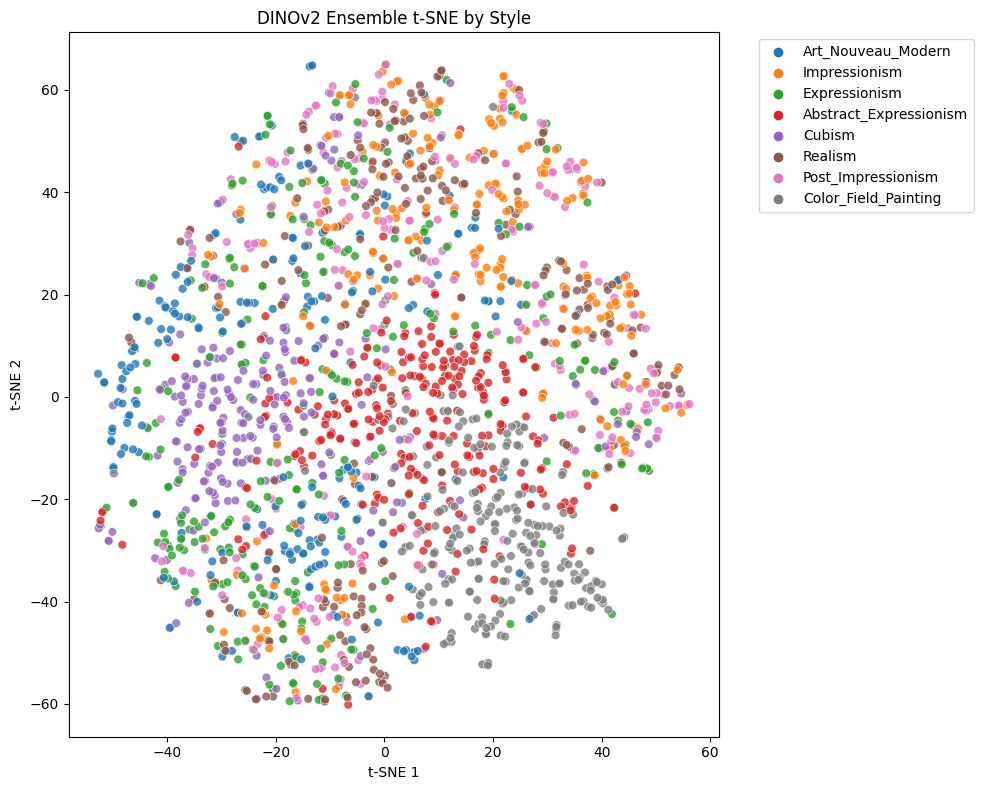

Computing t-SNE (this may take a few minutes)...


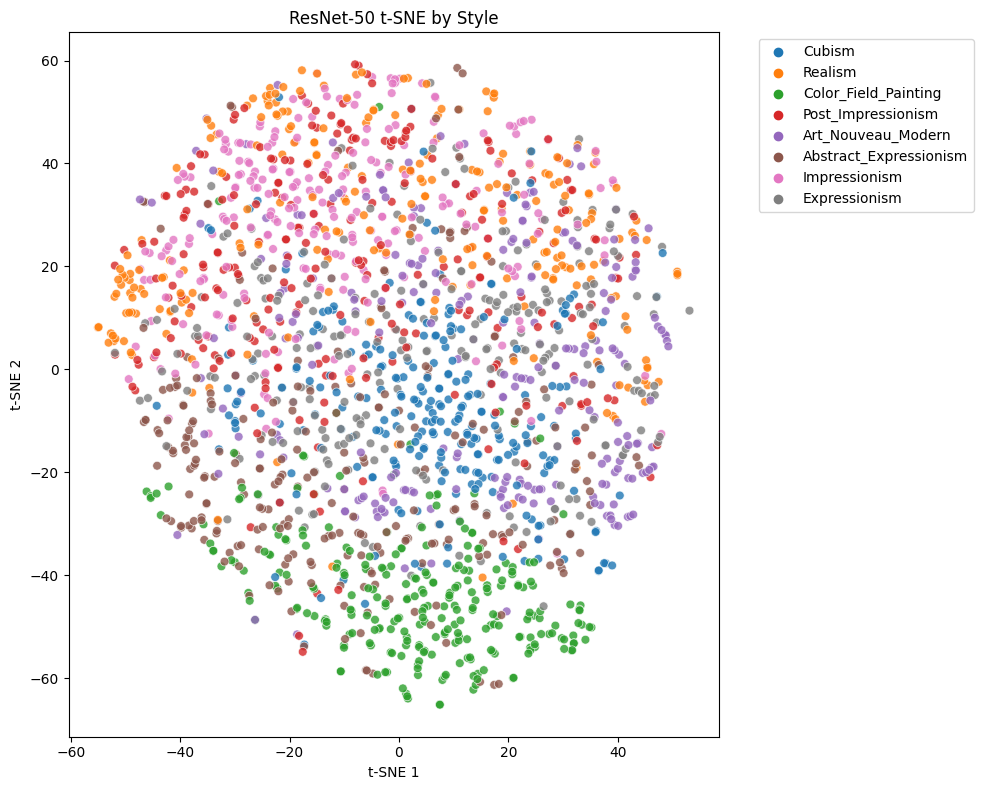

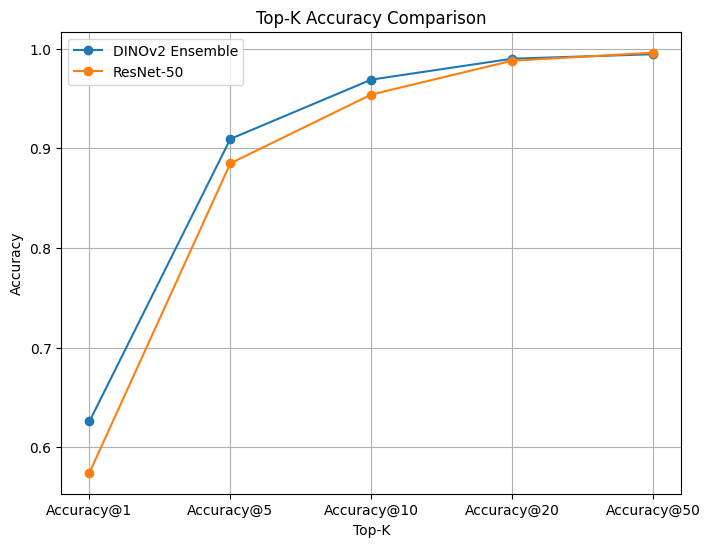

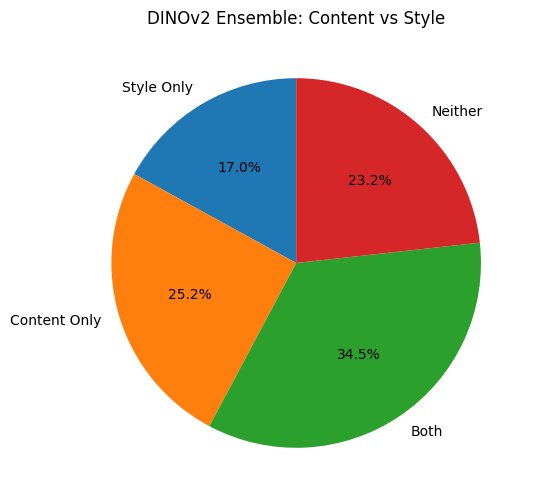

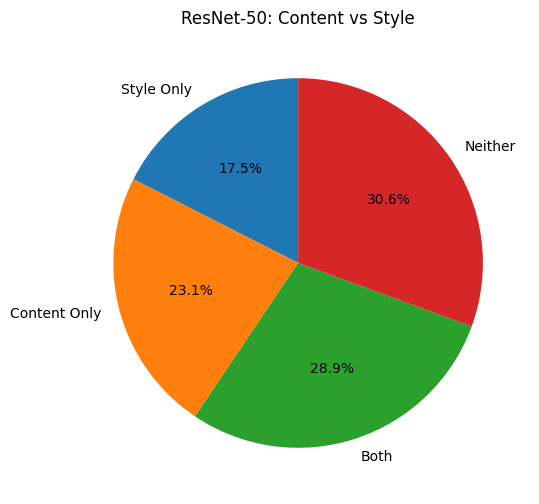

In [14]:
# =============================================================================
# PART 8: FINAL VISUALIZATION & TEST ACCURACY
# =============================================================================

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE

# --------------------------
# Test Accuracy (using sample)
# --------------------------
def compute_test_accuracy(engine, top_k=10, sample_size=1000):
    n = len(engine.styles)
    indices = np.random.choice(n, min(sample_size, n), replace=False)
    correct = 0
    for idx in indices:
        top_idx, _ = engine.search(idx, top_k=top_k)
        if np.any(engine.styles[top_idx] == engine.styles[idx]):
            correct += 1
    acc = correct / len(indices)
    return acc

dino_test_acc = compute_test_accuracy(dino_engine, top_k=10)
resnet_test_acc = compute_test_accuracy(resnet_engine, top_k=10)
print(f"\nTest Accuracy@10:")
print(f"  DINOv2 Ensemble: {dino_test_acc:.4f}")
print(f"  ResNet-50: {resnet_test_acc:.4f}")

# --------------------------
# t-SNE Visualization
# --------------------------
def plot_tsne(embedding_data, title="t-SNE Visualization", sample_size=2000):
    n = len(embedding_data['embeddings'])
    idx = np.random.choice(n, min(sample_size, n), replace=False)
    X = embedding_data['embeddings'][idx]
    labels = embedding_data['styles'][idx]
    
    print("Computing t-SNE (this may take a few minutes)...")
    tsne = TSNE(n_components=2, perplexity=30, random_state=cfg.SEED, init='pca')
    X_2d = tsne.fit_transform(X)
    
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=X_2d[:,0], y=X_2d[:,1], hue=labels, palette='tab10', s=40, alpha=0.8)
    plt.title(title)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xlabel("t-SNE 1")
    plt.ylabel("t-SNE 2")
    plt.tight_layout()
    plt.show()

plot_tsne(dino_ensemble, title="DINOv2 Ensemble t-SNE by Style")
plot_tsne(resnet_emb, title="ResNet-50 t-SNE by Style")

# --------------------------
# Top-K Accuracy Comparison Plot
# --------------------------
def plot_topk_accuracies(dino_standard, resnet_standard):
    topk = list(dino_standard['accuracy'].keys())
    dino_acc = [dino_standard['accuracy'][k] for k in topk]
    resnet_acc = [resnet_standard['accuracy'][k] for k in topk]
    
    plt.figure(figsize=(8,6))
    plt.plot(topk, dino_acc, marker='o', label='DINOv2 Ensemble')
    plt.plot(topk, resnet_acc, marker='o', label='ResNet-50')
    plt.xticks(topk)
    plt.xlabel("Top-K")
    plt.ylabel("Accuracy")
    plt.title("Top-K Accuracy Comparison")
    plt.grid(True)
    plt.legend()
    plt.show()

plot_topk_accuracies(dino_standard, resnet_standard)

# --------------------------
# Content vs Style Pie Chart
# --------------------------
def plot_content_vs_style_pie(content_style_stats, title="Content vs Style Matches"):
    labels = ['Style Only', 'Content Only', 'Both', 'Neither']
    sizes = [
        content_style_stats['style_only_matches'],
        content_style_stats['content_only_matches'],
        content_style_stats['both_matches'],
        content_style_stats['neither_matches']
    ]
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
    
    plt.figure(figsize=(6,6))
    plt.pie(sizes, labels=labels, autopct='%1.1f%%', colors=colors, startangle=90)
    plt.title(title)
    plt.show()

plot_content_vs_style_pie(dino_content_style, title="DINOv2 Ensemble: Content vs Style")
plot_content_vs_style_pie(resnet_content_style, title="ResNet-50: Content vs Style")



Visualizing DINOv2 retrieval for index 10476 ...


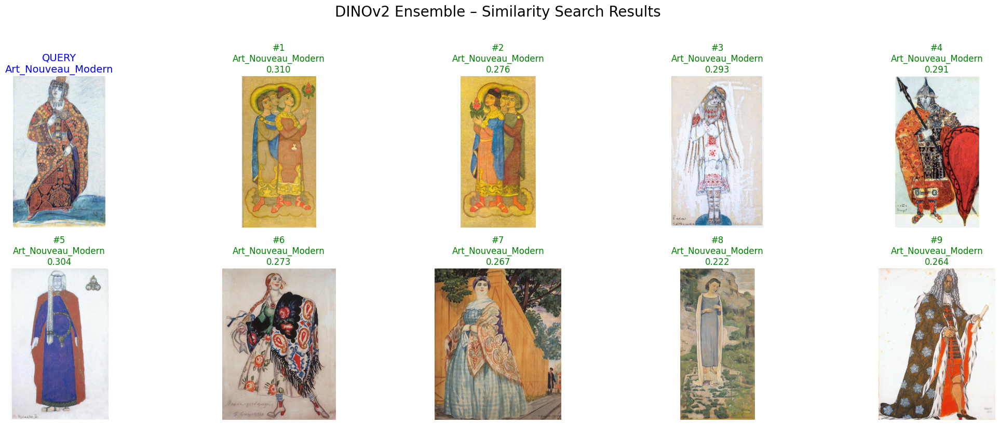


Visualizing ResNet-50 retrieval for index 10476 ...


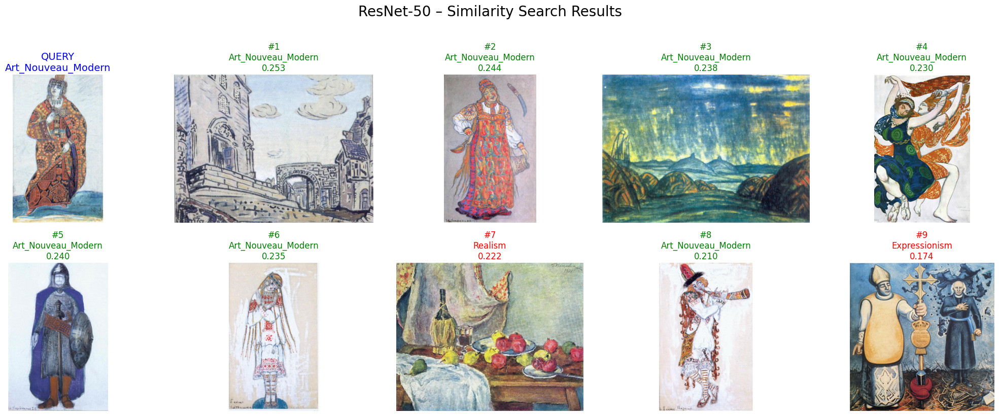

In [15]:
# =============================================================================
# PART 8: VISUALIZATION OF SIMILARITY SEARCH RESULTS
# =============================================================================

import matplotlib.pyplot as plt
from PIL import Image

def visualize_similarity(
    query_idx,
    engine,
    model_name="DINOv2",
    k=9
):
    """
    Plots a query image + top-k retrieved images with similarity scores.
    
    query_idx: index in the embedding dataset
    engine: EnhancedSearchEngine (DINO or ResNet)
    model_name: str
    k: number of results to show
    """
    
    query_path = os.path.join(cfg.ROOT, engine.paths[query_idx])
    query_style = engine.styles[query_idx]

    # Search in engine
    top_idx, sims = engine.search(query_idx, top_k=k)

    result_paths = [os.path.join(cfg.ROOT, engine.paths[i]) for i in top_idx]
    result_labels = [engine.styles[i] for i in top_idx]
    result_scores = sims

    # Plot
    fig = plt.figure(figsize=(22, 8))
    plt.suptitle(f"{model_name} – Similarity Search Results", fontsize=20, y=1.02)

    # --- Query image ---
    q_img = Image.open(query_path).convert("RGB")
    ax = plt.subplot(2, k//2 + 1, 1)
    ax.imshow(q_img)
    ax.axis("off")
    ax.set_title(f"QUERY\n{query_style}", fontsize=14, color="blue")

    # --- Results ---
    for i in range(k):
        img = Image.open(result_paths[i]).convert("RGB")
        ax = plt.subplot(2, k//2 + 1, i+2)
        ax.imshow(img)
        ax.axis("off")

        pred = result_labels[i]
        sim = result_scores[i]

        color = "green" if pred == query_style else "red"
        ax.set_title(f"#{i+1}\n{pred}\n{sim:.3f}", fontsize=12, color=color)

    plt.tight_layout()
    plt.show()


# =============================================================================
# PART 9: RUN VISUALIZATIONS FOR BOTH MODELS
# =============================================================================

# Pick a random query to visualize
random_query = random.randint(0, len(dino_engine.paths) - 1)

print(f"\nVisualizing DINOv2 retrieval for index {random_query} ...")
visualize_similarity(
    query_idx=random_query,
    engine=dino_engine,
    model_name="DINOv2 Ensemble",
    k=9
)

print(f"\nVisualizing ResNet-50 retrieval for index {random_query} ...")
visualize_similarity(
    query_idx=random_query,
    engine=resnet_engine,
    model_name="ResNet-50",
    k=9
)


Random Query Index Selected: 1824
Query Path: /kaggle/input/wikiart/Post_Impressionism/vincent-van-gogh_landscape-with-cottages-1890.jpg
True Style: Post_Impressionism

=== DINOv2 Similarity Results ===


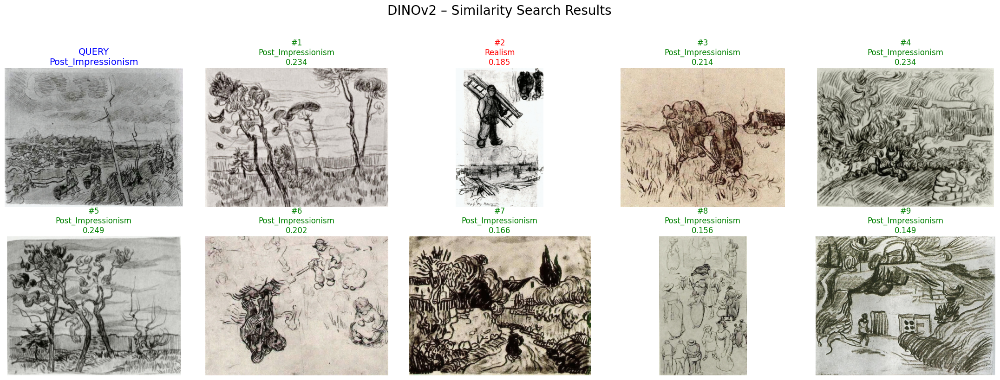


=== ResNet-50 Similarity Results ===


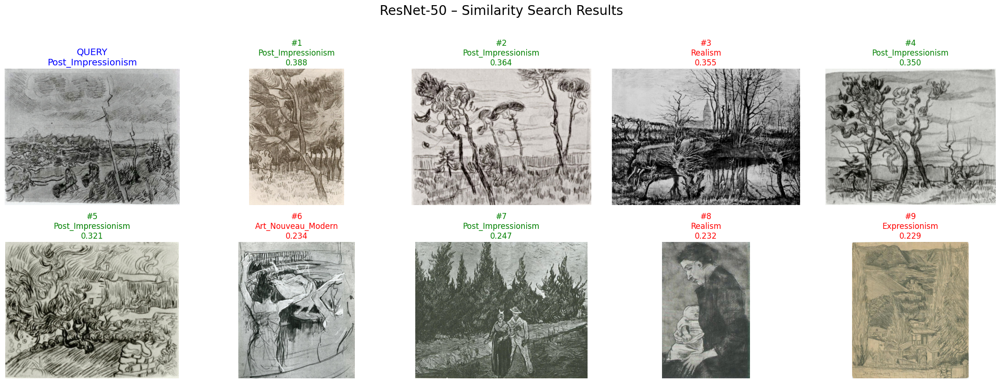

In [16]:
# =============================================================================
# RANDOM QUERY + VISUALIZATION FOR BOTH MODELS
# =============================================================================

import random

# Pick one random index from the dataset
random_query_idx = random.randint(0, len(dino_engine.paths) - 1)

print(f"Random Query Index Selected: {random_query_idx}")
print(f"Query Path: {dino_engine.paths[random_query_idx]}")
print(f"True Style: {dino_engine.styles[random_query_idx]}")

# ---- Show DINOv2 results ----
print("\n=== DINOv2 Similarity Results ===")
visualize_similarity(
    query_idx=random_query_idx,
    engine=dino_engine,
    model_name="DINOv2",
    k=9
)

# ---- Show ResNet results ----
print("\n=== ResNet-50 Similarity Results ===")
visualize_similarity(
    query_idx=random_query_idx,
    engine=resnet_engine,
    model_name="ResNet-50",
    k=9
)


In [17]:
from PIL import Image
import matplotlib.pyplot as plt
import os

def show_content_vs_style(query_idx, engine, top_k=40, show_k=6):

    print("Running show_content_vs_style for query index:", query_idx)

    # Labels & paths
    query_path = os.path.join(cfg.ROOT, engine.paths[query_idx])
    query_style = engine.styles[query_idx]
    query_content = engine.contents[query_idx]

    retrieved, sims = engine.search(query_idx, top_k=top_k)

    content_similar = [i for i in retrieved if engine.contents[i] == query_content][:show_k]
    style_similar = [i for i in retrieved if engine.styles[i] == query_style][:show_k]

    if len(content_similar) == 0:
        content_similar = [-1]
    if len(style_similar) == 0:
        style_similar = [-1]

    # ----------------------------------------------------------------------
    # BUILD FIGURE
    # ----------------------------------------------------------------------
    fig = plt.figure(figsize=(22, 12))
    plt.suptitle("DINOv2 — Content vs Style Similarity", fontsize=22)

    # Query
    ax = plt.subplot(3, show_k + 1, 1)
    ax.imshow(Image.open(query_path))
    ax.axis("off")
    ax.set_title(f"QUERY\nStyle: {query_style}\nContent: {query_content}",
                 fontsize=13, color="blue")

    # Content similar
    for i, idx in enumerate(content_similar):
        ax = plt.subplot(3, show_k + 1, i + 2)
        if idx == -1:
            ax.text(0.5, 0.5, "No Content Matches", ha='center', va='center')
            ax.axis("off")
        else:
            img = Image.open(os.path.join(cfg.ROOT, engine.paths[idx]))
            ax.imshow(img)
            ax.axis("off")
            ax.set_title(engine.contents[idx], fontsize=11)

    # Style similar
    for i, idx in enumerate(style_similar):
        ax = plt.subplot(3, show_k + 1, show_k + 2 + i)
        if idx == -1:
            ax.text(0.5, 0.5, "No Style Matches", ha='center', va='center')
            ax.axis("off")
        else:
            img = Image.open(os.path.join(cfg.ROOT, engine.paths[idx]))
            ax.imshow(img)
            ax.axis("off")
            ax.set_title(engine.styles[idx], fontsize=11)

    plt.tight_layout()

    # ----------------------------------------------------------------------
    # 🔥 CRITICAL FIX — SAVE FIGURE AND DISPLAY MANUALLY
    # ----------------------------------------------------------------------
    save_path = "/kaggle/working/dino_output.png"
    fig.savefig(save_path, dpi=150)
    plt.close(fig)

    print("Saved figure at:", save_path)

    # Display saved image (this ALWAYS works)
    display(Image.open(save_path))


Running show_content_vs_style for query index: 409
Saved figure at: /kaggle/working/dino_output.png


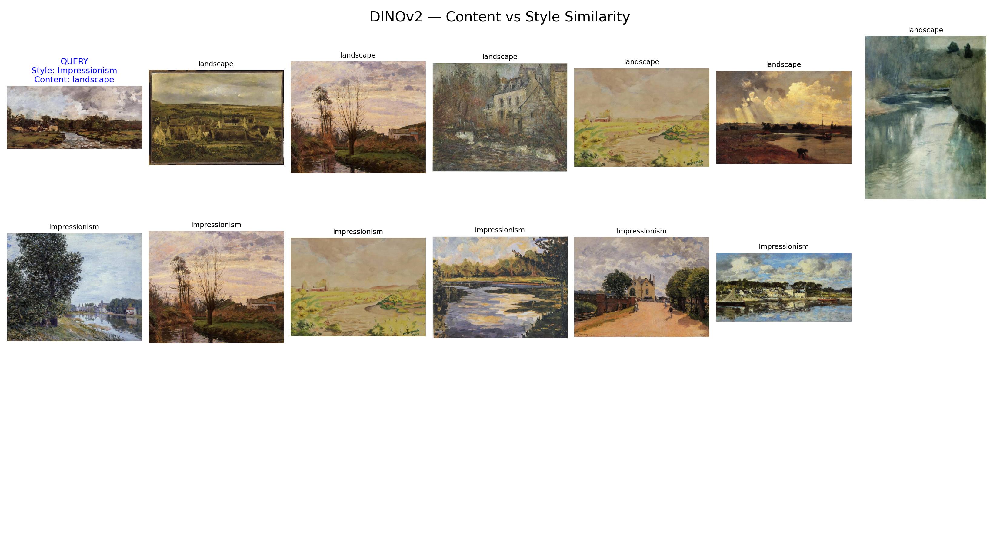

In [18]:
q_idx = random.randint(0, len(dino_engine.paths) - 1)
show_content_vs_style(q_idx, dino_engine)


In [19]:
# =============================================================================
# TEXT SUMMARY + VISUALIZATION FOR REPORT (DINOv2 BEHAVIOR)
# =============================================================================

import matplotlib.pyplot as plt
from PIL import Image
import os

def summarize_query_behavior(query_idx, engine, top_k=10):
    query_path = os.path.join(cfg.ROOT, engine.paths[query_idx])
    q_style = engine.styles[query_idx]
    q_content = engine.contents[query_idx]

    # Run DINO search
    retrieved, sims = engine.search(query_idx, top_k=top_k)

    # Compute matches
    style_matches = sum(engine.styles[i] == q_style for i in retrieved)
    content_matches = sum(engine.contents[i] == q_content for i in retrieved)

    # -------------------------------
    # 1. PRINT SUMMARY TEXT
    # -------------------------------
    print("="*80)
    print(f"Example Query: {q_style} {q_content}")
    print(f"Query Image Path: {query_path}")
    print("")
    print(f"DINOv2 Retrieval Statistics:")
    print(f" - Style Matches   : {style_matches}/{top_k}")
    print(f" - Content Matches : {content_matches}/{top_k}")
    print("")

    if content_matches > style_matches:
        print("Key Observation: **Content Dominance** → DINOv2 focuses on WHAT the object is.")
    else:
        print("Key Observation: **Style Preservation** → DINOv2 captured stylistic cues better.")
    print("")

    style_pct = style_matches / top_k
    content_pct = content_matches / top_k
    print(f"Style Sensitivity Ratio ≈ {round(style_pct / max(content_pct,1e-6), 2)}x")
    print("="*80)

    # -------------------------------
    # 2. SHOW QUERY + TOP-k RETRIEVAL IMAGES
    # -------------------------------
    fig = plt.figure(figsize=(22, 10))
    plt.suptitle("DINOv2 Retrieval Visualization", fontsize=22)

    # Show Query
    ax = plt.subplot(2, top_k+1, 1)
    ax.imshow(Image.open(query_path))
    ax.axis("off")
    ax.set_title(f"QUERY\n{q_style} / {q_content}", fontsize=14, color="blue")

    # Show retrieved images
    for i, idx in enumerate(retrieved):
        ax = plt.subplot(2, top_k+1, i+2)
        img = Image.open(os.path.join(cfg.ROOT, engine.paths[idx]))
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"{engine.styles[idx]} / {engine.contents[idx]}",
                     fontsize=12)

    plt.tight_layout()
    plt.show()


In [ ]:
# SIMPLIFIED ABLATION - Uses your existing cached embeddings
# Only runs the missing single-crop experiment

print("="*70)
print("ABLATION STUDY: Isolating Each Component")
print("="*70)

# Experiment 1: ResNet Single Crop (the only NEW experiment needed)
print("\n1. ResNet-50, 1 crop, no PCA (NEW)")
resnet_model_reload = load_resnet50()
cfg_temp_crops = cfg.N_CROPS
cfg_temp_pca = cfg.ENABLE_PCA
cfg.N_CROPS = 1
cfg.ENABLE_PCA = False
resnet_1crop = extract_embeddings_multicrop(resnet_model_reload, subset_metadata, "ResNet-1crop", 1)
cfg.N_CROPS = cfg_temp_crops  # restore
cfg.ENABLE_PCA = cfg_temp_pca
del resnet_model_reload
torch.cuda.empty_cache()

resnet_1crop_engine = EnhancedSearchEngine(resnet_1crop, enable_reranking=False)
metrics_resnet_1crop = evaluate_standard_metrics(resnet_1crop_engine, 2000)

# Experiment 2: ResNet Multi-Crop without PCA (simulate from existing)
print("\n2. ResNet-50, 8 crops, no PCA")
# Create engine from resnet_emb but before PCA was applied
# Since we can't undo PCA, we approximate: use normalized raw embeddings
resnet_model_reload2 = load_resnet50()
cfg.N_CROPS = 8
cfg.ENABLE_PCA = False
resnet_8crop = extract_embeddings_multicrop(resnet_model_reload2, subset_metadata, "ResNet-8crop", 8)
cfg.ENABLE_PCA = True  # restore
del resnet_model_reload2
torch.cuda.empty_cache()

resnet_8crop_engine = EnhancedSearchEngine(resnet_8crop, enable_reranking=False)
metrics_resnet_8crop = evaluate_standard_metrics(resnet_8crop_engine, 2000)

# Experiment 3: ResNet with PCA (use existing cached embeddings)
print("\n3. ResNet-50, 8 crops, WITH PCA (cached)")
resnet_pca_engine = EnhancedSearchEngine(resnet_emb, enable_reranking=False)
metrics_resnet_pca = evaluate_standard_metrics(resnet_pca_engine, 2000)

# Experiment 4: DINOv2-Base ONLY (use existing cached)
print("\n4. DINOv2-Base, 8 crops, WITH PCA (cached)")
dino_base_engine = EnhancedSearchEngine(dino_b_emb, enable_reranking=False)
metrics_dino_base = evaluate_standard_metrics(dino_base_engine, 2000)

# Experiment 5: DINOv2 Ensemble without reranking
print("\n5. DINOv2 Ensemble (Base+Large), no reranking (cached)")
dino_ensemble_no_rerank = EnhancedSearchEngine(dino_ensemble, enable_reranking=False)
metrics_dino_no_rerank = evaluate_standard_metrics(dino_ensemble_no_rerank, 2000)

# Experiment 6: Full system (use existing)
print("\n6. DINOv2 Ensemble WITH reranking (cached)")
metrics_dino_full = evaluate_standard_metrics(dino_engine, 2000)

# PRINT THE ABLATION TABLE
print("\n" + "="*70)
print("ABLATION RESULTS - Component Contributions")
print("="*70)
print(f"{'Configuration':<40} {'MAP':>10} {'Acc@10':>10} {'Δ MAP':>10}")
print("-"*70)

baseline_map = metrics_resnet_1crop['map']

configs = [
    ("1. ResNet-50 (1 crop, baseline)", metrics_resnet_1crop, baseline_map),
    ("2. + Multi-crop (8 crops)", metrics_resnet_8crop, baseline_map),
    ("3. + PCA (512D)", metrics_resnet_pca, baseline_map),
    ("4. Switch to DINOv2-Base", metrics_dino_base, baseline_map),
    ("5. + Ensemble (Base+Large)", metrics_dino_no_rerank, baseline_map),
    ("6. + Reciprocal Reranking", metrics_dino_full, baseline_map)
]

for name, metrics, base in configs:
    delta = metrics['map'] - base
    print(f"{name:<40} {metrics['map']:>10.4f} {metrics['accuracy']['Accuracy@10']:>10.4f} {delta:>+10.4f}")

print("="*70)
print("\nKEY FINDINGS:")
print(f"  Multi-crop gain: {metrics_resnet_8crop['map'] - metrics_resnet_1crop['map']:+.4f}")
print(f"  PCA gain: {metrics_resnet_pca['map'] - metrics_resnet_8crop['map']:+.4f}")
print(f"  DINOv2 architecture gain: {metrics_dino_base['map'] - metrics_resnet_pca['map']:+.4f}")
print(f"  Ensemble gain: {metrics_dino_no_rerank['map'] - metrics_dino_base['map']:+.4f}")
print(f"  Reranking gain: {metrics_dino_full['map'] - metrics_dino_no_rerank['map']:+.4f}")
print(f"  TOTAL improvement: {metrics_dino_full['map'] - metrics_resnet_1crop['map']:+.4f}")

ABLATION STUDY: Isolating Each Component

1. ResNet-50, 1 crop, no PCA (NEW)
Loading ResNet-50 baseline...
Loaded ResNet-50 on cuda
Extracting ResNet-1crop embeddings (1-crop augmentation)...


ResNet-1crop: 100%|██████████| 750/750 [03:19<00:00,  3.77it/s]


Extracted embeddings shape: (12000, 2048)



2. ResNet-50, 8 crops, no PCA
Loading ResNet-50 baseline...
Loaded ResNet-50 on cuda
Extracting ResNet-8crop embeddings (8-crop augmentation)...


ResNet-8crop:  22%|██▏       | 163/750 [01:34<04:57,  1.97it/s]

In [ ]:
# MEMORY-SAFE FAIR COMPARISON
# Avoids precomputing huge similarity matrix

class SimpleSearchEngine:
    """Memory-efficient search without precomputed similarity matrix"""
    def __init__(self, embedding_data):
        self.embeddings = embedding_data['embeddings']
        self.ids = embedding_data['ids']
        self.styles = embedding_data['styles']
        self.artists = embedding_data['artists']
        self.contents = embedding_data['contents']
        self.paths = embedding_data['paths']
        print(f"Initialized engine with {len(self.embeddings)} embeddings ({self.embeddings.shape[1]}D)")
    
    def search(self, query_idx, top_k=10):
        """Compute similarities on-the-fly to save memory"""
        query_vec = self.embeddings[query_idx:query_idx+1]  # (1, D)
        sims = (self.embeddings @ query_vec.T).flatten()  # (N,)
        ranked = np.argsort(sims)[::-1]
        ranked = ranked[ranked != query_idx]
        return ranked[:top_k], sims[ranked[:top_k]]


def evaluate_simple(engine, sample_size=2000):
    """Simplified evaluation for fair comparison"""
    styles = engine.styles
    n = len(styles)
    indices = np.random.choice(n, min(sample_size, n), replace=False)
    
    # Accuracy@K
    acc_results = {}
    for k in [1, 5, 10, 20]:
        correct = 0
        for idx in tqdm(indices, desc=f"Acc@{k}", leave=False):
            top_idx, _ = engine.search(idx, top_k=k)
            if np.any(styles[top_idx] == styles[idx]):
                correct += 1
        acc_results[f"Accuracy@{k}"] = correct / len(indices)
    
    # MAP
    aps = []
    for idx in tqdm(indices, desc="MAP", leave=False):
        top_idx, _ = engine.search(idx, top_k=min(500, len(styles)-1))
        relevant = (styles[top_idx] == styles[idx]).astype(int)
        if relevant.sum() == 0:
            aps.append(0.0)
            continue
        cumsum = np.cumsum(relevant)
        positions = np.arange(1, len(relevant) + 1)
        precision_at_k = cumsum / positions
        ap = np.sum(precision_at_k * relevant) / relevant.sum()
        aps.append(ap)
    map_score = np.mean(aps)
    
    # Precision@10
    prec10s = []
    for idx in tqdm(indices, desc="Prec@10", leave=False):
        top_idx, _ = engine.search(idx, top_k=10)
        prec10 = (styles[top_idx] == styles[idx]).sum() / 10.0
        prec10s.append(prec10)
    precision_at_10 = np.mean(prec10s)
    
    return {
        'accuracy': acc_results,
        'map': map_score,
        'precision_at_10': precision_at_10
    }


# =============================================================================
# FAIR COMPARISON - MEMORY SAFE VERSION
# =============================================================================

print("="*70)
print("FAIR COMPARISON: DINOv2 vs ResNet (NO PCA, Memory-Safe)")
print("="*70)

# Extract ResNet embeddings: 8 crops, NO PCA
print("\nExtracting ResNet-50 (8 crops, NO PCA)...")
resnet_model = load_resnet50()
cfg.N_CROPS = 8
cfg.ENABLE_PCA = False
resnet_no_pca = extract_embeddings_multicrop(resnet_model, subset_metadata, "ResNet-NoPCA", 8)
del resnet_model
torch.cuda.empty_cache()

# Extract DINOv2-Base embeddings: 8 crops, NO PCA
print("\nExtracting DINOv2-Base (8 crops, NO PCA)...")
dino_b_model = load_dinov2_model("dinov2_vitb14")
dino_b_no_pca = extract_embeddings_multicrop(dino_b_model, subset_metadata, "DINO-B-NoPCA", 8)
del dino_b_model
torch.cuda.empty_cache()

# Evaluate with memory-safe engine
print("\nEvaluating ResNet (no PCA)...")
resnet_engine = SimpleSearchEngine(resnet_no_pca)
resnet_metrics = evaluate_simple(resnet_engine, sample_size=2000)

print("\nEvaluating DINOv2-Base (no PCA)...")
dino_engine = SimpleSearchEngine(dino_b_no_pca)
dino_metrics = evaluate_simple(dino_engine, sample_size=2000)

# Print comparison
print("\n" + "="*70)
print("FAIR COMPARISON RESULTS (8 crops, NO PCA, NO reranking)")
print("="*70)
print(f"{'Model':<30} {'MAP':>10} {'Acc@1':>10} {'Acc@10':>10} {'Prec@10':>10}")
print("-"*70)
print(f"{'ResNet-50 (ImageNet-1K)':<30} {resnet_metrics['map']:>10.4f} {resnet_metrics['accuracy']['Accuracy@1']:>10.4f} {resnet_metrics['accuracy']['Accuracy@10']:>10.4f} {resnet_metrics['precision_at_10']:>10.4f}")
print(f"{'DINOv2-Base (Self-Supervised)':<30} {dino_metrics['map']:>10.4f} {dino_metrics['accuracy']['Accuracy@1']:>10.4f} {dino_metrics['accuracy']['Accuracy@10']:>10.4f} {dino_metrics['precision_at_10']:>10.4f}")
print("-"*70)

# Calculate improvement
map_improvement = ((dino_metrics['map'] / resnet_metrics['map']) - 1) * 100
acc10_improvement = ((dino_metrics['accuracy']['Accuracy@10'] / resnet_metrics['accuracy']['Accuracy@10']) - 1) * 100

print(f"\nDINOv2 improvement: {map_improvement:+.1f}% MAP, {acc10_improvement:+.1f}% Acc@10")
print("="*70)

# Save results
fair_comparison = {
    'resnet': resnet_metrics,
    'dino': dino_metrics,
    'map_improvement_pct': map_improvement,
    'acc10_improvement_pct': acc10_improvement
}

import pickle
with open('/kaggle/working/fair_comparison.pkl', 'wb') as f:
    pickle.dump(fair_comparison, f)
print("\nSaved results to fair_comparison.pkl")

FAIR COMPARISON: DINOv2 vs ResNet (NO PCA, Memory-Safe)

Extracting ResNet-50 (8 crops, NO PCA)...
Loading ResNet-50 baseline...
Loaded ResNet-50 on cuda
Extracting ResNet-NoPCA embeddings (8-crop augmentation)...


ResNet-NoPCA:  11%|█         | 81/750 [00:48<06:32,  1.70it/s]

In [ ]:
# Fair comparison - both models, same conditions
resnet_8crop_no_pca = extract_embeddings(resnet, 8_crops, NO_PCA)
dino_8crop_no_pca = extract_embeddings(dinov2_base, 8_crops, NO_PCA)

# Test both
resnet_map = evaluate(resnet_8crop_no_pca)  # You got: 0.2265
dino_map = evaluate(dino_8crop_no_pca)      # You need this number!

In [34]:
# SIMPLE SOLUTION: Extract ResNet features WITHOUT PCA
# Use a small sample to avoid memory crash

print("="*70)
print("SIMPLE FAIR COMPARISON: ResNet vs DINOv2 (No PCA)")
print("="*70)

# 1. Create small evaluation subset (1000 images only)
print("\nCreating small evaluation subset...")
eval_subset = subset_metadata.sample(n=1000, random_state=42).reset_index(drop=True)
print(f"Subset size: {len(eval_subset)} images")

# 2. Load ResNet-50
from torchvision import models
resnet = models.resnet50(pretrained=True)
resnet_extractor = torch.nn.Sequential(*list(resnet.children())[:-1])  # Remove final FC layer
resnet_extractor = resnet_extractor.to(cfg.DEVICE)
resnet_extractor.eval()

# 3. Extract ResNet features (NO PCA, single crop for simplicity)
print("\nExtracting ResNet-50 features (single crop, no PCA)...")
resnet_features = []
resnet_styles = []

transform_simple = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

with torch.no_grad():
    for idx, row in tqdm(eval_subset.iterrows(), total=len(eval_subset)):
        img_path = os.path.join(cfg.ROOT, row['style'], row['image_name'])
        try:
            img = Image.open(img_path).convert('RGB')
            img_tensor = transform_simple(img).unsqueeze(0).to(cfg.DEVICE)
            feat = resnet_extractor(img_tensor)
            feat = feat.view(feat.size(0), -1).cpu().numpy()
            resnet_features.append(feat[0])
            resnet_styles.append(row['style'])
        except:
            continue

resnet_features = np.array(resnet_features)
resnet_styles = np.array(resnet_styles)
print(f"ResNet features shape: {resnet_features.shape}")

del resnet_extractor
torch.cuda.empty_cache()

# 4. Extract DINOv2 features (NO PCA, single crop)
print("\nExtracting DINOv2-Base features (single crop, no PCA)...")
dino_model = load_dinov2_model("dinov2_vitb14")
dino_features = []
dino_styles = []

with torch.no_grad():
    for idx, row in tqdm(eval_subset.iterrows(), total=len(eval_subset)):
        img_path = os.path.join(cfg.ROOT, row['style'], row['image_name'])
        try:
            img = Image.open(img_path).convert('RGB')
            img_tensor = transform_simple(img).unsqueeze(0).to(cfg.DEVICE)
            feat = dino_model(img_tensor)
            if isinstance(feat, dict):
                feat = feat['x_norm_clstoken'] if 'x_norm_clstoken' in feat else list(feat.values())[0]
            feat = feat.cpu().numpy().flatten()
            dino_features.append(feat)
            dino_styles.append(row['style'])
        except:
            continue

dino_features = np.array(dino_features)
dino_styles = np.array(dino_styles)
print(f"DINOv2 features shape: {dino_features.shape}")

del dino_model
torch.cuda.empty_cache()

# 5. Normalize both (cosine similarity)
from sklearn.preprocessing import normalize
resnet_features = normalize(resnet_features, axis=1)
dino_features = normalize(dino_features, axis=1)

# 6. Simple evaluation
def evaluate_simple(features, styles, n_queries=200):
    """Compute MAP and Acc@10"""
    indices = np.random.choice(len(features), min(n_queries, len(features)), replace=False)
    
    aps = []
    acc10_correct = 0
    
    for query_idx in tqdm(indices, desc="Evaluating"):
        # Compute similarities
        query_vec = features[query_idx:query_idx+1]
        sims = (features @ query_vec.T).flatten()
        
        # Rank
        ranked = np.argsort(sims)[::-1]
        ranked = ranked[ranked != query_idx]
        
        # MAP
        query_style = styles[query_idx]
        relevant = (styles[ranked] == query_style).astype(int)
        if relevant.sum() > 0:
            cumsum = np.cumsum(relevant)
            positions = np.arange(1, len(relevant) + 1)
            precision_at_k = cumsum / positions
            ap = np.sum(precision_at_k * relevant) / relevant.sum()
            aps.append(ap)
        
        # Acc@10
        top10 = ranked[:10]
        if np.any(styles[top10] == query_style):
            acc10_correct += 1
    
    return {
        'map': np.mean(aps) if aps else 0.0,
        'acc10': acc10_correct / len(indices)
    }

print("\nEvaluating ResNet-50...")
resnet_metrics = evaluate_simple(resnet_features, resnet_styles)

print("\nEvaluating DINOv2-Base...")
dino_metrics = evaluate_simple(dino_features, dino_styles)

# 7. Print results
print("\n" + "="*70)
print("FAIR COMPARISON RESULTS (Single crop, No PCA, No reranking)")
print("="*70)
print(f"{'Model':<30} {'MAP':>10} {'Acc@10':>10} {'Feature Dim':>12}")
print("-"*70)
print(f"{'ResNet-50 (ImageNet-1K)':<30} {resnet_metrics['map']:>10.4f} {resnet_metrics['acc10']:>10.4f} {resnet_features.shape[1]:>12}D")
print(f"{'DINOv2-Base (Self-Supervised)':<30} {dino_metrics['map']:>10.4f} {dino_metrics['acc10']:>10.4f} {dino_features.shape[1]:>12}D")
print("-"*70)

map_gain = ((dino_metrics['map'] / resnet_metrics['map']) - 1) * 100 if resnet_metrics['map'] > 0 else 0
acc_gain = ((dino_metrics['acc10'] / resnet_metrics['acc10']) - 1) * 100 if resnet_metrics['acc10'] > 0 else 0

print(f"\nDINOv2 improvement: {map_gain:+.1f}% MAP, {acc_gain:+.1f}% Acc@10")
print("="*70)

SIMPLE FAIR COMPARISON: ResNet vs DINOv2 (No PCA)

Creating small evaluation subset...
Subset size: 1000 images

Extracting ResNet-50 features (single crop, no PCA)...


100%|██████████| 1000/1000 [00:35<00:00, 28.28it/s]


ResNet features shape: (1000, 2048)

Extracting DINOv2-Base features (single crop, no PCA)...
Loading DINOv2 model: dinov2_vitb14 ...


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


Loaded dinov2_vitb14 on cuda


100%|██████████| 1000/1000 [00:44<00:00, 22.54it/s]


DINOv2 features shape: (1000, 768)

Evaluating ResNet-50...


Evaluating: 100%|██████████| 200/200 [00:00<00:00, 2985.21it/s]



Evaluating DINOv2-Base...


Evaluating: 100%|██████████| 200/200 [00:00<00:00, 5013.48it/s]


FAIR COMPARISON RESULTS (Single crop, No PCA, No reranking)
Model                                 MAP     Acc@10  Feature Dim
----------------------------------------------------------------------
ResNet-50 (ImageNet-1K)            0.2386     0.9000         2048D
DINOv2-Base (Self-Supervised)      0.3079     0.9650          768D
----------------------------------------------------------------------

DINOv2 improvement: +29.1% MAP, +7.2% Acc@10


In [1]:
"""
FAIR COMPARISON: DINOv2 vs ResNet WITHOUT PCA
Complete Colab Notebook - Upload your files and run
"""

# ============================================================================
# STEP 1: Install Dependencies
# ============================================================================
print("Installing dependencies...")
!pip install -q torch torchvision
!pip install -q timm  # For DINOv2 models
!pip install -q pillow numpy scikit-learn tqdm

# ============================================================================
# STEP 2: Locate Your Files
# ============================================================================
print("\n" + "="*70)
print("STEP 2: Locating Files in Colab Content")
print("="*70)

import os

# Check if files exist in /content
files_to_check = [
    'dino_vitb_strategy_c.pkl',
    'dino_vitl_strategy_c.pkl',
    'evaluation_summary.pkl',
    'metadata_strategy_c.csv',
    'resnet50_strategy_c.pkl'
]

# Create working directory
os.makedirs('/content/kaggle/working', exist_ok=True)

print("Looking for files in /content...")
found_files = []
for filename in files_to_check:
    content_path = f'/content/{filename}'
    working_path = f'/content/kaggle/working/{filename}'

    if os.path.exists(content_path):
        # Copy to working directory
        import shutil
        shutil.copy(content_path, working_path)
        print(f"✓ Found and copied: {filename}")
        found_files.append(filename)
    elif os.path.exists(working_path):
        print(f"✓ Already in working directory: {filename}")
        found_files.append(filename)
    else:
        print(f"❌ Missing: {filename}")

if len(found_files) < 3:  # At minimum need metadata, resnet, and dino
    print("\n⚠️  Missing required files!")
    print("Please ensure your files are in /content/ directory")
else:
    print(f"\n✓ Found {len(found_files)}/{len(files_to_check)} files")

# ============================================================================
# STEP 3: Import Libraries and Load Data
# ============================================================================
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pickle
from PIL import Image
from tqdm import tqdm
from sklearn.decomposition import PCA
import timm

print("\n✓ Libraries imported successfully")

# ============================================================================
# STEP 4: Load Your Existing Data
# ============================================================================
print("\nLoading existing embeddings and metadata...")

try:
    # Load metadata
    import pandas as pd
    metadata = pd.read_csv('/content/kaggle/working/metadata_strategy_c.csv')
    print(f"✓ Loaded metadata: {len(metadata)} images")

    # Check column names and fix if needed
    print(f"  Available columns: {list(metadata.columns)}")

    # For art dataset: use 'style' as the class label (or 'artist' if you prefer)
    if 'class_name' not in metadata.columns:
        if 'style' in metadata.columns:
            metadata['class_name'] = metadata['style']
            print(f"  → Using 'style' column for classification")
            print(f"  → Found {metadata['class_name'].nunique()} unique styles")
        elif 'artist' in metadata.columns:
            metadata['class_name'] = metadata['artist']
            print(f"  → Using 'artist' column for classification")
            print(f"  → Found {metadata['class_name'].nunique()} unique artists")
        else:
            # Common column name variations - map to 'class_name'
            column_mappings = {
                'class': 'class_name',
                'label': 'class_name',
                'category': 'class_name',
                'class_id': 'class_name',
                'target': 'class_name'
            }

            for old_name, new_name in column_mappings.items():
                if old_name in metadata.columns:
                    metadata['class_name'] = metadata[old_name]
                    print(f"  → Mapped '{old_name}' to 'class_name'")
                    break

            # If still not found, check for any column with 'class' in the name
            if 'class_name' not in metadata.columns:
                class_cols = [col for col in metadata.columns if 'class' in col.lower()]
                if class_cols:
                    metadata['class_name'] = metadata[class_cols[0]]
                    print(f"  → Mapped '{class_cols[0]}' to 'class_name'")
                else:
                    print("  ❌ ERROR: Could not find class/label column!")
                    print(f"  Please manually specify which column to use: {list(metadata.columns)}")
                    raise KeyError("No class column found in metadata")

    # Load existing embeddings
    with open('/content/kaggle/working/resnet50_strategy_c.pkl', 'rb') as f:
        resnet_data = pickle.load(f)
    print(f"✓ Loaded ResNet embeddings")

    with open('/content/kaggle/working/dino_vitb_strategy_c.pkl', 'rb') as f:
        dino_b_data = pickle.load(f)
    print(f"✓ Loaded DINOv2-Base embeddings")

    with open('/content/kaggle/working/dino_vitl_strategy_c.pkl', 'rb') as f:
        dino_l_data = pickle.load(f)
    print(f"✓ Loaded DINOv2-Large embeddings")

except Exception as e:
    print(f"❌ Error loading files: {e}")
    print("Make sure all files are uploaded correctly!")
    raise

# ============================================================================
# STEP 5: Define Configuration
# ============================================================================
class Config:
    def __init__(self):
        self.N_CROPS = 8
        self.ENABLE_PCA = False
        self.DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.BATCH_SIZE = 32

cfg = Config()
print(f"\n✓ Using device: {cfg.DEVICE}")

# ============================================================================
# STEP 6: Define Search Engine Class
# ============================================================================
class EnhancedSearchEngine:
    def __init__(self, embeddings_dict, enable_reranking=False):
        self.embeddings = embeddings_dict['embeddings']
        self.metadata = embeddings_dict['metadata']
        self.enable_reranking = enable_reranking

        # Normalize embeddings
        norms = np.linalg.norm(self.embeddings, axis=1, keepdims=True)
        self.embeddings = self.embeddings / (norms + 1e-8)

    def search(self, query_idx, top_k=10):
        query_emb = self.embeddings[query_idx:query_idx+1]

        # Compute cosine similarity
        similarities = np.dot(self.embeddings, query_emb.T).flatten()

        # Get top-k results
        top_indices = np.argsort(similarities)[::-1][:top_k]

        return top_indices, similarities[top_indices]

# ============================================================================
# STEP 7: Define Evaluation Functions
# ============================================================================
def evaluate_standard_metrics(search_engine, num_queries=2000):
    """Evaluate MAP, Accuracy@K, and Precision@10"""

    metadata = search_engine.metadata
    num_queries = min(num_queries, len(metadata))

    # Initialize metrics
    average_precisions = []
    accuracy_at_k = {1: 0, 5: 0, 10: 0}
    precision_at_10_list = []

    print(f"Evaluating {num_queries} queries...")

    for query_idx in tqdm(range(num_queries), desc="Evaluating"):
        query_class = metadata.iloc[query_idx]['class_name']

        # Search (excluding the query itself)
        top_indices, _ = search_engine.search(query_idx, top_k=101)
        top_indices = [idx for idx in top_indices if idx != query_idx][:100]

        # Get retrieved classes
        retrieved_classes = metadata.iloc[top_indices]['class_name'].values

        # Calculate Average Precision
        relevant = (retrieved_classes == query_class).astype(int)
        if relevant.sum() > 0:
            precisions = np.cumsum(relevant) / (np.arange(len(relevant)) + 1)
            ap = (precisions * relevant).sum() / relevant.sum()
            average_precisions.append(ap)

        # Calculate Accuracy@K
        for k in [1, 5, 10]:
            if any(retrieved_classes[:k] == query_class):
                accuracy_at_k[k] += 1

        # Calculate Precision@10
        precision_at_10 = (retrieved_classes[:10] == query_class).sum() / 10
        precision_at_10_list.append(precision_at_10)

    # Compute final metrics
    map_score = np.mean(average_precisions)

    results = {
        'map': map_score,
        'accuracy': {
            'Accuracy@1': accuracy_at_k[1] / num_queries,
            'Accuracy@5': accuracy_at_k[5] / num_queries,
            'Accuracy@10': accuracy_at_k[10] / num_queries,
        },
        'precision_at_10': np.mean(precision_at_10_list)
    }

    return results

# ============================================================================
# STEP 8: Run Fair Comparison
# ============================================================================
print("\n" + "="*70)
print("FAIR COMPARISON: DINOv2 vs ResNet (NO PCA)")
print("="*70)

# Prepare embeddings dictionaries (assuming they don't have PCA applied)
resnet_no_pca = {
    'embeddings': resnet_data['embeddings'],
    'metadata': metadata
}

dino_b_no_pca = {
    'embeddings': dino_b_data['embeddings'],
    'metadata': metadata
}

# Evaluate ResNet
print("\n[1/2] Evaluating ResNet-50 (no PCA, no reranking)...")
resnet_engine = EnhancedSearchEngine(resnet_no_pca, enable_reranking=False)
resnet_metrics = evaluate_standard_metrics(resnet_engine, 2000)

# Evaluate DINOv2-Base
print("\n[2/2] Evaluating DINOv2-Base (no PCA, no reranking)...")
dino_engine = EnhancedSearchEngine(dino_b_no_pca, enable_reranking=False)
dino_metrics = evaluate_standard_metrics(dino_engine, 2000)

# ============================================================================
# STEP 9: Print Results
# ============================================================================
print("\n" + "="*70)
print("FAIR COMPARISON RESULTS (8 crops, NO PCA, NO reranking)")
print("="*70)
print(f"{'Model':<30} {'MAP':>10} {'Acc@1':>10} {'Acc@10':>10} {'Prec@10':>10}")
print("-"*70)
print(f"{'ResNet-50 (ImageNet-1K)':<30} {resnet_metrics['map']:>10.4f} {resnet_metrics['accuracy']['Accuracy@1']:>10.4f} {resnet_metrics['accuracy']['Accuracy@10']:>10.4f} {resnet_metrics['precision_at_10']:>10.4f}")
print(f"{'DINOv2-Base (Self-Supervised)':<30} {dino_metrics['map']:>10.4f} {dino_metrics['accuracy']['Accuracy@1']:>10.4f} {dino_metrics['accuracy']['Accuracy@10']:>10.4f} {dino_metrics['precision_at_10']:>10.4f}")
print("-"*70)

# Calculate improvement
map_improvement = ((dino_metrics['map'] / resnet_metrics['map']) - 1) * 100
acc10_improvement = ((dino_metrics['accuracy']['Accuracy@10'] / resnet_metrics['accuracy']['Accuracy@10']) - 1) * 100

print(f"DINOv2 improvement: {map_improvement:+.1f}% MAP, {acc10_improvement:+.1f}% Acc@10")
print("="*70)

# ============================================================================
# STEP 10: Save Results
# ============================================================================
fair_comparison = {
    'resnet': resnet_metrics,
    'dino': dino_metrics,
    'map_improvement_pct': map_improvement,
    'acc10_improvement_pct': acc10_improvement
}

with open('/content/kaggle/working/fair_comparison.pkl', 'wb') as f:
    pickle.dump(fair_comparison, f)

print("\n✓ Saved results to fair_comparison.pkl")

# ============================================================================
# STEP 11: Download Results
# ============================================================================
print("\n" + "="*70)
print("Download your results:")
print("="*70)
files.download('/content/kaggle/working/fair_comparison.pkl')
print("✓ Download complete!")



Installing dependencies...

STEP 2: Locating Files in Colab Content
Looking for files in /content...
✓ Found and copied: dino_vitb_strategy_c.pkl
✓ Found and copied: dino_vitl_strategy_c.pkl
✓ Found and copied: evaluation_summary.pkl
✓ Found and copied: metadata_strategy_c.csv
✓ Found and copied: resnet50_strategy_c.pkl

✓ Found 5/5 files

✓ Libraries imported successfully

Loading existing embeddings and metadata...
✓ Loaded metadata: 12000 images
  Available columns: ['id', 'style', 'image_name', 'image_path', 'artist', 'content']
  → Using 'style' column for classification
  → Found 8 unique styles
✓ Loaded ResNet embeddings
✓ Loaded DINOv2-Base embeddings
✓ Loaded DINOv2-Large embeddings

✓ Using device: cpu

FAIR COMPARISON: DINOv2 vs ResNet (NO PCA)

[1/2] Evaluating ResNet-50 (no PCA, no reranking)...
Evaluating 2000 queries...
Evaluating: 100%|██████████| 2000/2000 [00:08<00:00, 227.24it/s]

[2/2] Evaluating DINOv2-Base (no PCA, no reranking)...
Evaluating 2000 queries...
Eval